In [1]:
import scanpy as sc
import decoupler as dc

# Only needed for processing
import numpy as np
import pandas as pd

# Plotting options, change to your liking
sc.settings.set_figure_params(dpi=300, frameon=False)
sc.set_figure_params(dpi=300)
sc.set_figure_params(figsize=(4, 4))

In [5]:
###Load Xenium Data
adata = sc.read_h5ad('/mnt/hsKidAt/blake_LTS/Atlas_V2/xenium/Human_Kidney_Xenium_Full_Object_04-2025_Niche-k10.h5ad')
adata

AnnData object with n_obs × n_vars = 383771 × 5001
    obs: 'library', 'nCount_Spatial', 'nFeature_Spatial', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'source', 'assay', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'age_binned', 'sex', 'race', 'tissue_type', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.l1', 'v2.state.l2', 'v2.state.l1', 'v2.class', 'v2.structure', 'nCount_niche', 'nFeature_niche', 'niches'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'spatial'
    layers: 'counts'

In [6]:
###Prepare Xenium Data
# Add "N_" prefix to the niches column values
adata.obs['niches'] = adata.obs['niches'].astype('category')
adata.obs['niches'] = 'N_' + adata.obs['niches'].astype(str)
#copy counts to X
adata.X = adata.layers['counts'].copy()
# Normalize the data
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
# Store norm counts
adata.layers['log_norm'] = adata.X.copy()
adata

AnnData object with n_obs × n_vars = 383771 × 5001
    obs: 'library', 'nCount_Spatial', 'nFeature_Spatial', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'source', 'assay', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'age_binned', 'sex', 'race', 'tissue_type', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.l1', 'v2.state.l2', 'v2.state.l1', 'v2.class', 'v2.structure', 'nCount_niche', 'nFeature_niche', 'niches'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts', 'log_norm'

/tmp/ipykernel_5918/3031093452.py:14: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=['niches'], spot_size = 10, size=5, wspace=0, frameon=False, palette=niche_colors)
... storing 'library' as categorical
... storing 'source' as categorical
... storing 'assay' as categorical
... storing 'experiment' as categorical
... storing 'patient' as categorical
... storing 'specimen' as categorical
... storing 'condition_level3' as categorical
... storing 'condition_level2' as categorical
... storing 'condition_level1' as categorical
... storing 'condition' as categorical
... storing 'age_binned' as categorical
... storing 'sex' as categorical
... storing 'race' as categorical
... storing 'tissue_type' as categorical
... storing 'v2.subclass.full' as categorical
... storing 'v2.subclass.l3' as categorical
... storing 'v2.subclass.l2' as categorical
... storing 'v2.subclass.l1' as categorical
... storing 'v2.state.l2' as categorical
... storing 'v2.state.l1' 

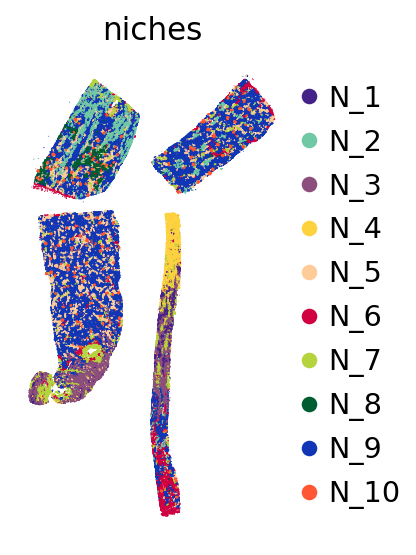

In [7]:
#Plot niches
niche_colors = {
    'N_1': '#442288',
    'N_2': '#71c8a5',
    'N_3': '#8C4F7D',
    'N_4': '#FED23F',
    'N_5': '#FFCC99',
    'N_6': '#d10040',
    'N_7': '#B5D33D',
    'N_8': '#005C31',
    'N_9': '#1036b5',
    'N_10': '#FF5733'
}   
sc.pl.spatial(adata, color=['niches'], spot_size = 10, size=5, wspace=0, frameon=False, palette=niche_colors)

/tmp/ipykernel_5918/4240647514.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="conn", spot_size = 10, size=2.5)


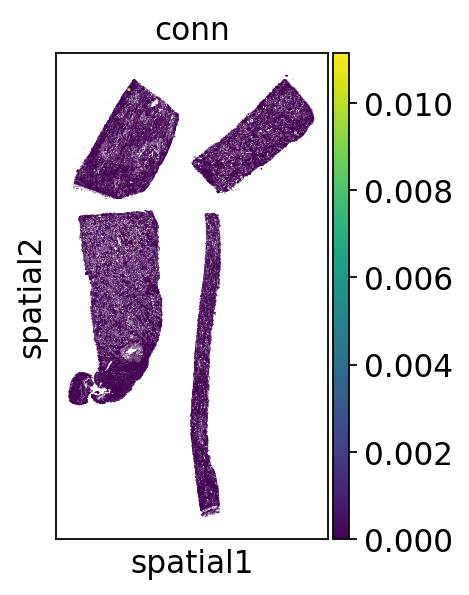

In [8]:
###Spatial Weighting
dc.pp.knn(adata, key="spatial", bw=100, cutoff=0.1)
# Plot the spatial weights of one spot
adata.obs["conn"] = adata.obsp["spatial_connectivities"][0].toarray().ravel()
sc.pl.spatial(adata, color="conn", spot_size = 10, size=2.5)

In [9]:
# Update X with spatially weighted gene exression
adata.X = adata.obsp["spatial_connectivities"].dot(adata.X)

/tmp/ipykernel_5918/1657864964.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=genes, spot_size = 10, size=5)


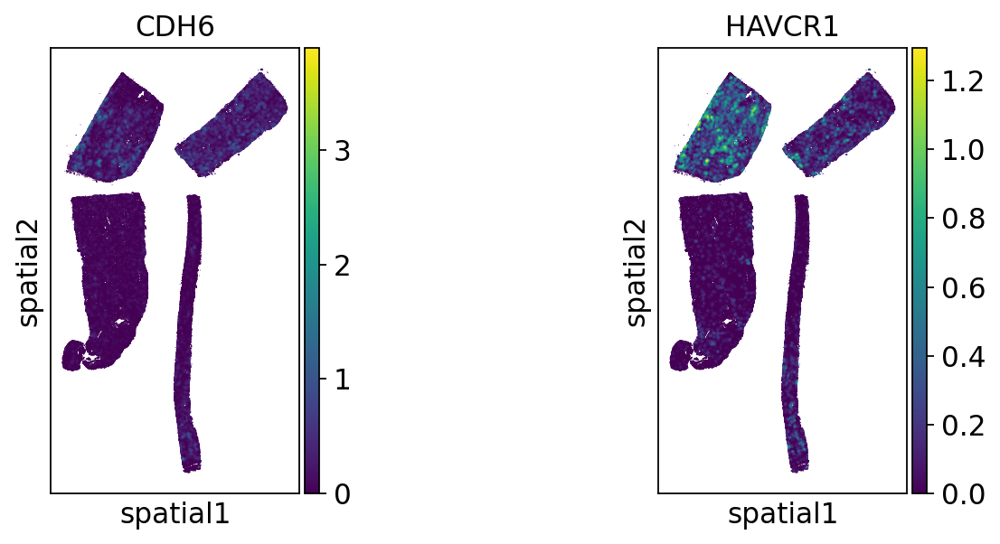

In [14]:
genes = ['CDH6', 'HAVCR1']

# Spatially weighted gene expression
sc.pl.spatial(adata, color=genes, spot_size = 10, size=5)

In [15]:
###Transcription factor activity inference
# read in trajectory (aPT2->PT-S1) TF-Gene interactions from scMEGA
net = pd.read_csv('/weka/blake/Projects/Human_Kidney/Atlas_V2/trajectories/aPT2-PT-S1_TF-Gene_Weight_Table.txt', sep='\t')
net

,source,target,weight
0,ARNT2,CSDC2,-0.968761
1,ARNT2,CHST9,0.964331
2,ARNT2,APBB1IP,0.962056
3,ARNT2,KCNK5,-0.958774
4,ARNT2,ANTXR1,0.954340
...,...,...,...
18495,VEZF1,LRRC28,-0.916307
18496,VEZF1,STK17A,0.915943
18497,VEZF1,IGF1R,-0.915844
18498,VEZF1,ENAH,0.915553


In [18]:
dc.mt.ulm(data=adata, net=net)

In [19]:
score = dc.pp.get_obsm(adata=adata, key="score_ulm")
score

AnnData object with n_obs × n_vars = 383771 × 37
    obs: 'library', 'nCount_Spatial', 'nFeature_Spatial', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'source', 'assay', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'age_binned', 'sex', 'race', 'tissue_type', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.l1', 'v2.state.l2', 'v2.state.l1', 'v2.class', 'v2.structure', 'nCount_niche', 'nFeature_niche', 'niches', 'conn'
    uns: 'log1p', 'niches_colors'
    obsm: 'spatial', 'score_ulm', 'padj_ulm'

In [21]:
#Write score to h5ad
score.write_h5ad("/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Decoupler_TF-Scores_10212025.h5ad", compression='gzip')

In [ ]:
#load score
#score = sc.read_h5ad("/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Decoupler_TF-Scores_10212025.h5ad")
#score

/tmp/ipykernel_5918/1766913712.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(score, color=[tf, "niches"], cmap="RdBu_r", vcenter=0, size=5,spot_size = 10, title=[f"{tf} score", "niches"])


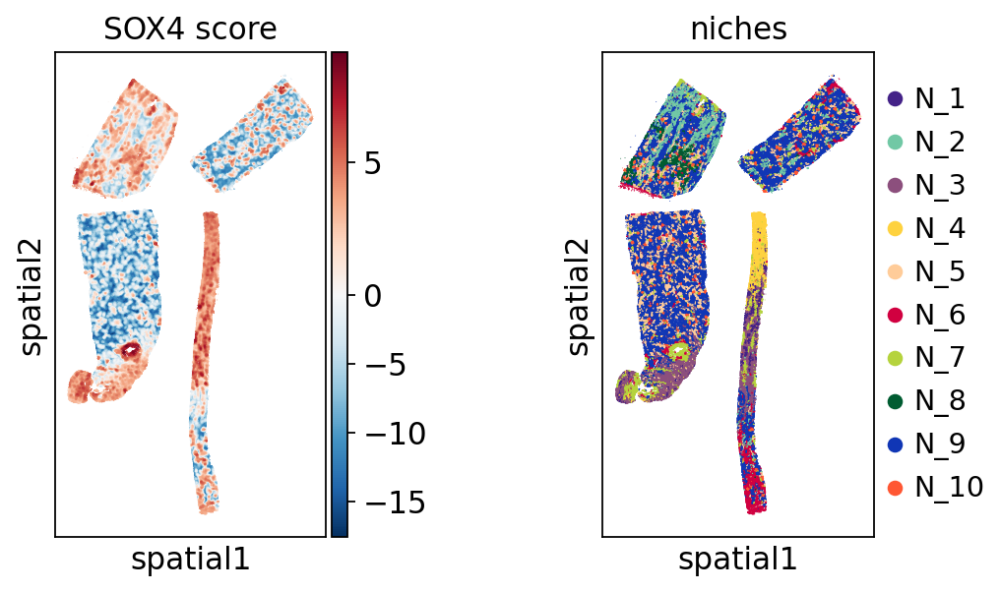

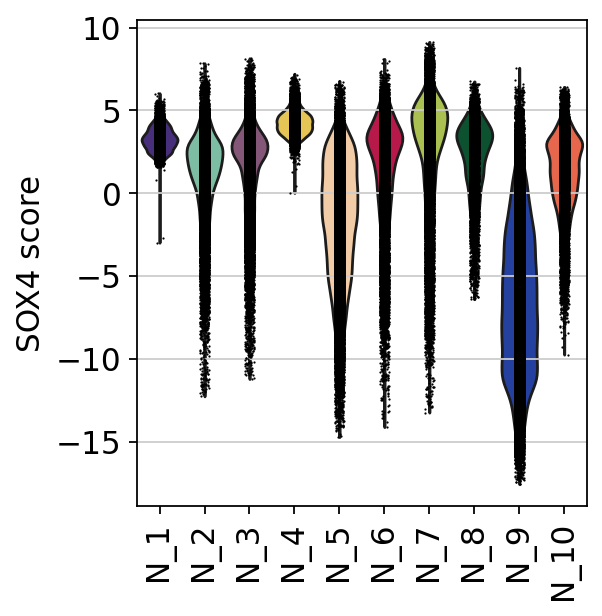

In [23]:
tf = "SOX4"
sc.pl.spatial(score, color=[tf, "niches"], cmap="RdBu_r", vcenter=0, size=5,spot_size = 10, title=[f"{tf} score", "niches"])
sc.pl.violin(score, keys=tf, groupby="niches", rotation=90, ylabel=f"{tf} score")

In [24]:
df = dc.tl.rankby_group(adata=score, groupby="niches", reference="rest", method="t-test_overestim_var")
df = df[df["stat"] > 0.0]
df

,group,reference,name,stat,meanchange,pval,padj
0,N_2,rest,NFKB1,106.783258,3.415647,0.0,0.0
1,N_2,rest,JUN,104.296105,3.257264,0.0,0.0
2,N_2,rest,SOX4,102.881315,3.117437,0.0,0.0
3,N_2,rest,NFKB2,102.298037,3.260322,0.0,0.0
4,N_2,rest,FOSL2,101.363947,3.408081,0.0,0.0
...,...,...,...,...,...,...,...
360,N_4,rest,SOX4,133.905130,6.171021,0.0,0.0
361,N_4,rest,ATF3,133.323526,6.594885,0.0,0.0
362,N_4,rest,ARNT2,131.794279,4.764697,0.0,0.0
363,N_4,rest,NFKB2,127.250289,6.109706,0.0,0.0


In [25]:
n_markers = 3
source_markers = (
    df.groupby("group")
    .head(n_markers)
    .drop_duplicates("name")
    .groupby("group")["name"]
    .apply(lambda x: list(x))
    .to_dict()
)
source_markers

/tmp/ipykernel_5918/1918982502.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("group")
/tmp/ipykernel_5918/1918982502.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")["name"]


{'N_1': ['MSANTD3', 'POU3F3', 'ETS1'],
 'N_10': ['BACH2', 'JUND', 'FOSL2'],
 'N_2': ['NFKB1', 'JUN', 'SOX4'],
 'N_3': ['MITF', 'MYC'],
 'N_4': ['RUNX2'],
 'N_5': ['MAF', 'NR2F1', 'ARNT2'],
 'N_6': ['BHLHE40', 'ATF3', 'NFKB2'],
 'N_7': ['HOXB7'],
 'N_8': ['HIF1A', 'HES1'],
 'N_9': ['HNF1A', 'THRB', 'HNF4A']}

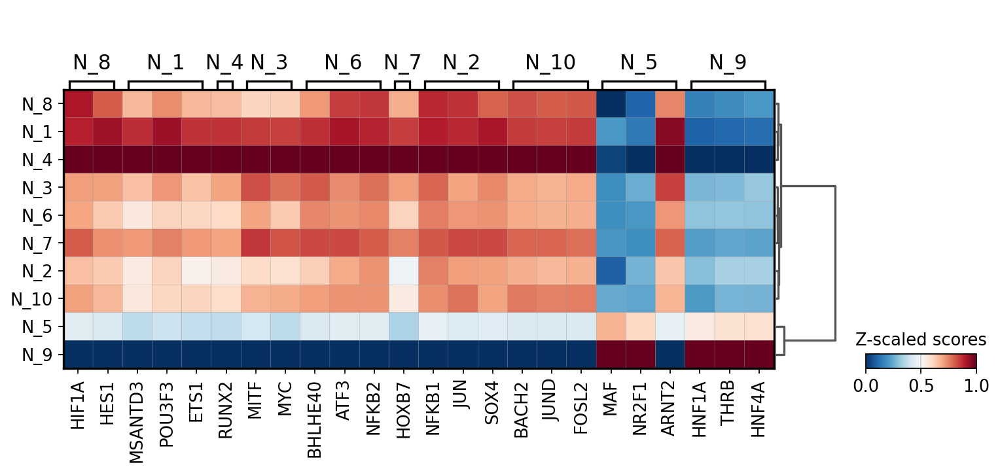

In [26]:
sc.pl.matrixplot(
    adata=score,
    var_names=source_markers,
    groupby="niches",
    dendrogram=True,
    standard_scale="var",
    colorbar_title="Z-scaled scores",
    cmap="RdBu_r",
)

/tmp/ipykernel_5918/865260297.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(score, color=tf, cmap="RdBu_r", vcenter=0, size=5,spot_size = 10, title=tf)


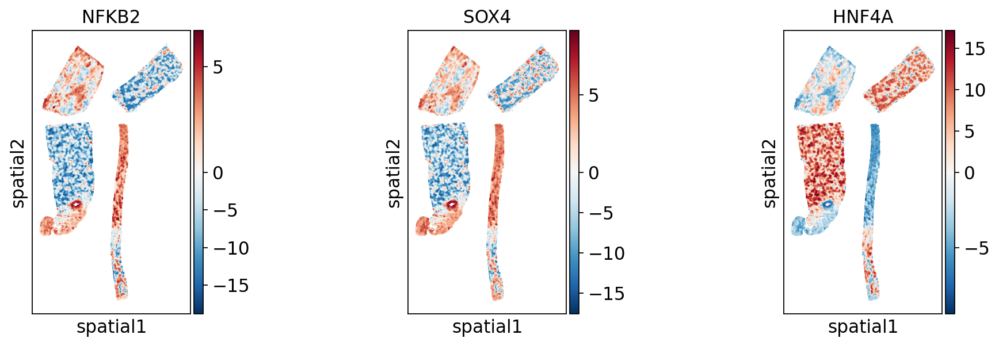

In [32]:
tf = ('NFKB2', 'SOX4', 'HNF4A')
sc.pl.spatial(score, color=tf, cmap="RdBu_r", vcenter=0, size=5,spot_size = 10, title=tf)

In [33]:
#subset adata to only include cells in the niches N_6, N_8 and N_9
score_niches = score[score.obs['niches'].isin(['N_6','N_8','N_9'])].copy()


In [34]:
df = dc.tl.rankby_group(adata=score_niches, groupby="niches", reference="rest", method="t-test_overestim_var")
df = df[df["stat"] > 0.0]
df

,group,reference,name,stat,meanchange,pval,padj
0,N_9,rest,THRB,559.621149,9.095470,0.0,0.0
1,N_9,rest,NR2F1,559.125502,8.635425,0.0,0.0
2,N_9,rest,HNF4A,556.392644,8.041349,0.0,0.0
3,N_9,rest,HNF1A,541.728812,8.339492,0.0,0.0
4,N_9,rest,MAF,456.302079,4.717250,0.0,0.0
...,...,...,...,...,...,...,...
101,N_8,rest,VEZF1,124.248317,6.351459,0.0,0.0
102,N_8,rest,ARNT2,117.637327,5.231874,0.0,0.0
103,N_8,rest,BHLHE40,113.098116,4.556976,0.0,0.0
104,N_8,rest,MYC,110.640036,4.331116,0.0,0.0


In [44]:
n_markers = 5
source_markers = (
    df.groupby("group")
    .head(n_markers)
    .drop_duplicates("name")
    .groupby("group")["name"]
    .apply(lambda x: list(x))
    .to_dict()
)
source_markers

/tmp/ipykernel_5918/1138687643.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("group")
/tmp/ipykernel_5918/1138687643.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")["name"]


{'N_6': ['MITF', 'ETS1', 'BHLHE40', 'MYC', 'VEZF1'],
 'N_8': ['HIF1A', 'HES1', 'BACH2', 'ATF4', 'JUN'],
 'N_9': ['THRB', 'NR2F1', 'HNF4A', 'HNF1A', 'MAF']}

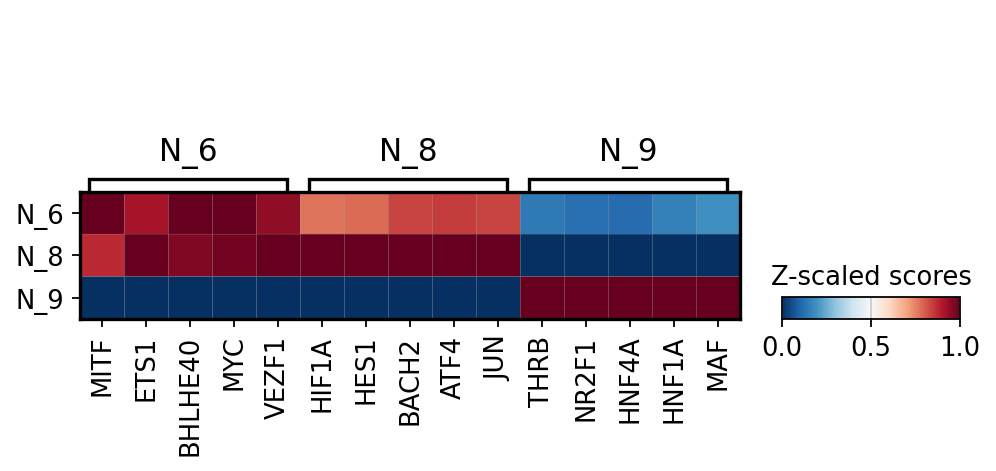

In [45]:
sc.pl.matrixplot(
    adata=score_niches,
    var_names=source_markers,
    groupby="niches",
    dendrogram=False,
    standard_scale="var",
    colorbar_title="Z-scaled scores",
    cmap="RdBu_r",
    save='HKAv2_Xenium_aPT2-PT_Traj_TFs_6-8-9-niches_10212025_heatmap.pdf')

/tmp/ipykernel_5918/195855904.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


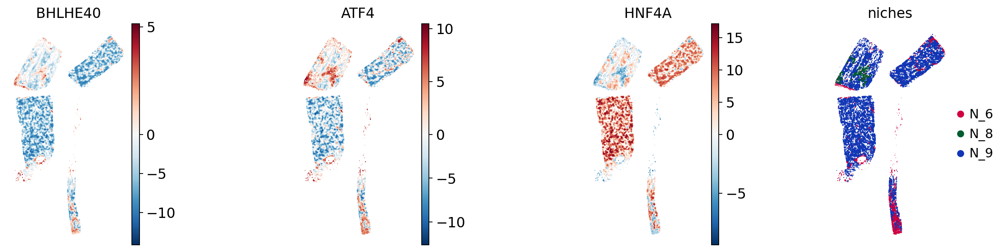

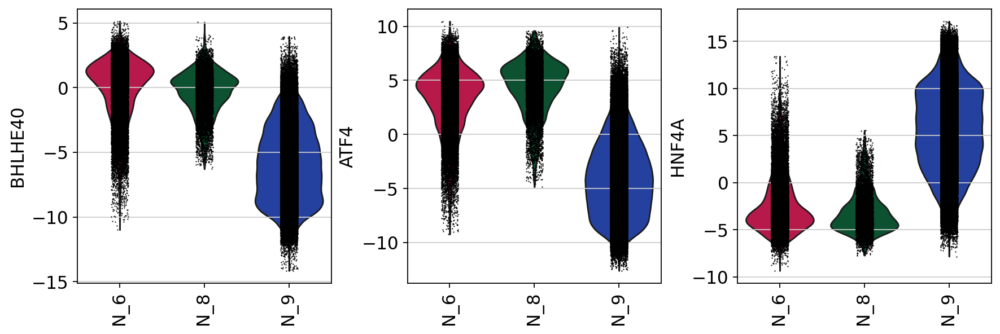

In [40]:
sc.pl.spatial(
    score_niches,
    color=['BHLHE40', 'ATF4', 'HNF4A', 'niches'],
    cmap='RdBu_r',
    size=5,spot_size = 10,
    vcenter=0,
    frameon=False,
    save='BHLHE40_ATF4_HNF4A_6-8-9-niches_10212025_spatial.pdf'
)
sc.pl.violin(
    score_niches,
    keys=['BHLHE40', 'ATF4', 'HNF4A'],
    groupby='niches',
    rotation=90,
    save='BHLHE40_ATF4_HNF4A_6-8-9-niches_10212025_Violin.pdf'
)

/tmp/ipykernel_5918/2284726134.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


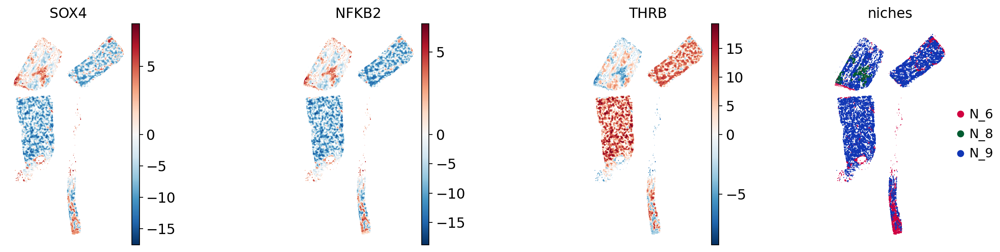

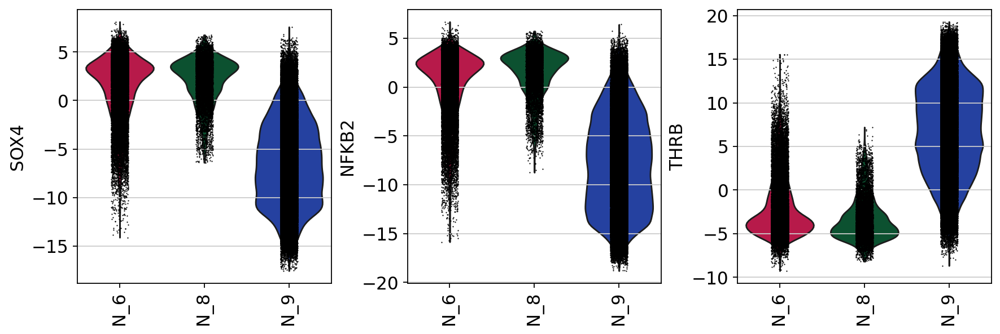

In [48]:
sc.pl.spatial(
    score_niches,
    color=['SOX4', 'NFKB2', 'THRB', 'niches'],
    cmap='RdBu_r',
    size=5,spot_size = 10,
    vcenter=0,
    frameon=False,
    save='SOX4_NFKB2_THRB_6-8-9-niches_10212025_spatial.pdf'
)
sc.pl.violin(
    score_niches,
    keys=['SOX4', 'NFKB2', 'THRB'],
    groupby='niches',
    rotation=90,
    save='SOX4_NFKB2_THRB_6-8-9-niches_10212025_Violin.pdf'
)

In [49]:
###Functional enrichment of biological terms
#Hallmark gene sets
hallmark = dc.op.hallmark(organism="human")
hallmark

,source,target
0,IL2_STAT5_SIGNALING,MAFF
1,COAGULATION,MAFF
2,HYPOXIA,MAFF
3,TNFA_SIGNALING_VIA_NFKB,MAFF
4,COMPLEMENT,MAFF
...,...,...
7313,PANCREAS_BETA_CELLS,STXBP1
7314,PANCREAS_BETA_CELLS,ELP4
7315,PANCREAS_BETA_CELLS,GCG
7316,PANCREAS_BETA_CELLS,PCSK2


In [50]:
dc.mt.ulm(data=adata, net=hallmark)

In [54]:
score = dc.pp.get_obsm(adata=adata, key="score_ulm")
score

AnnData object with n_obs × n_vars = 383771 × 50
    obs: 'library', 'nCount_Spatial', 'nFeature_Spatial', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'source', 'assay', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'age_binned', 'sex', 'race', 'tissue_type', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.l1', 'v2.state.l2', 'v2.state.l1', 'v2.class', 'v2.structure', 'nCount_niche', 'nFeature_niche', 'niches', 'conn'
    uns: 'log1p', 'niches_colors', 'dendrogram_niches'
    obsm: 'spatial', 'score_ulm', 'padj_ulm'

In [55]:
#Write score to h5ad
score.write_h5ad("/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Decoupler_Hallmark-Scores_10212025.h5ad", compression='gzip')

In [ ]:
#load score
#score = sc.read_h5ad("/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Decoupler_Hallmark-Scores_10212025.h5ad")
#score

In [56]:
#subset adata to only include cells in the niches N_6, N_8 and N_9
score_niches = score[score.obs['niches'].isin(['N_6','N_8','N_9'])].copy()

In [57]:
df = dc.tl.rankby_group(adata=score_niches, groupby="niches", reference="rest", method="t-test_overestim_var")
df = df[df["stat"] > 0]
df

,group,reference,name,stat,meanchange,pval,padj
0,N_9,rest,XENOBIOTIC_METABOLISM,397.111940,2.578832,0.000000e+00,0.000000e+00
1,N_9,rest,BILE_ACID_METABOLISM,359.983325,1.114856,0.000000e+00,0.000000e+00
2,N_9,rest,ESTROGEN_RESPONSE_LATE,341.947242,1.140755,0.000000e+00,0.000000e+00
3,N_9,rest,FATTY_ACID_METABOLISM,307.708733,1.937873,0.000000e+00,0.000000e+00
4,N_9,rest,ADIPOGENESIS,297.528098,1.974152,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...
136,N_8,rest,INTERFERON_ALPHA_RESPONSE,29.686899,0.351906,2.292874e-187,3.098479e-187
138,N_8,rest,TGF_BETA_SIGNALING,24.789832,0.390149,2.690701e-133,3.449616e-133
142,N_8,rest,WNT_BETA_CATENIN_SIGNALING,15.724120,0.149098,2.585220e-55,3.006070e-55
144,N_8,rest,HEDGEHOG_SIGNALING,13.403133,0.179224,9.413181e-41,1.045909e-40


In [59]:
n_markers = 10
source_markers = (
    df.groupby("group")
    .head(n_markers)
    .drop_duplicates("name")
    .groupby("group")["name"]
    .apply(lambda x: list(x))
    .to_dict()
)
source_markers

/tmp/ipykernel_5918/972976040.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("group")
/tmp/ipykernel_5918/972976040.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")["name"]


{'N_6': ['UV_RESPONSE_DN',
  'MITOTIC_SPINDLE',
  'WNT_BETA_CATENIN_SIGNALING',
  'PI3K_AKT_MTOR_SIGNALING',
  'KRAS_SIGNALING_UP',
  'APOPTOSIS',
  'APICAL_JUNCTION',
  'TGF_BETA_SIGNALING',
  'INTERFERON_GAMMA_RESPONSE',
  'INTERFERON_ALPHA_RESPONSE'],
 'N_8': ['E2F_TARGETS',
  'MYC_TARGETS_V1',
  'G2M_CHECKPOINT',
  'UNFOLDED_PROTEIN_RESPONSE',
  'DNA_REPAIR',
  'INFLAMMATORY_RESPONSE',
  'MYC_TARGETS_V2',
  'MTORC1_SIGNALING'],
 'N_9': ['XENOBIOTIC_METABOLISM',
  'BILE_ACID_METABOLISM',
  'ESTROGEN_RESPONSE_LATE',
  'FATTY_ACID_METABOLISM',
  'ADIPOGENESIS',
  'PANCREAS_BETA_CELLS',
  'HEME_METABOLISM',
  'OXIDATIVE_PHOSPHORYLATION',
  'KRAS_SIGNALING_DN',
  'PEROXISOME']}

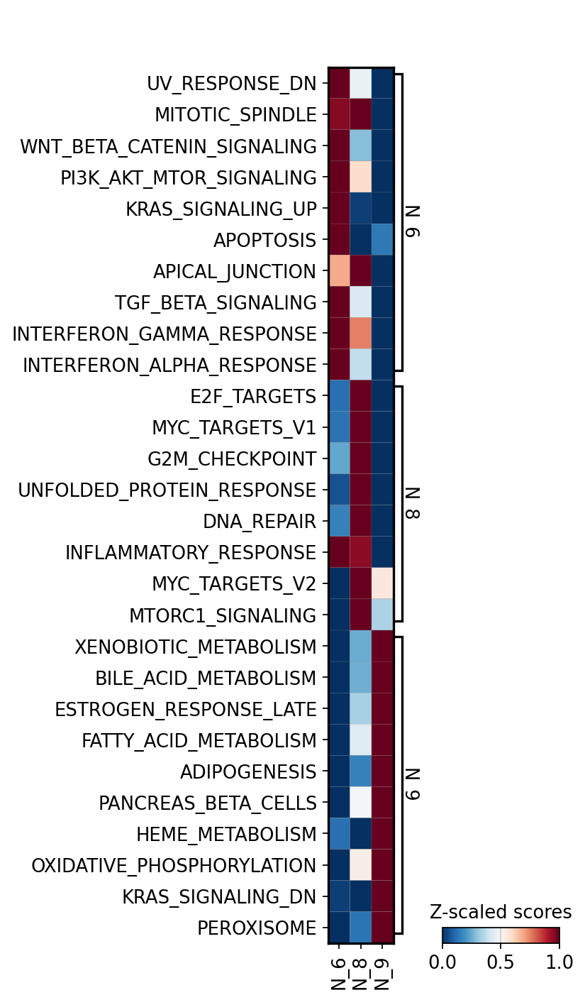

In [60]:
sc.pl.matrixplot(
    adata=score_niches,
    var_names=source_markers,
    groupby="niches",
    dendrogram=False,
    standard_scale="var",
    colorbar_title="Z-scaled scores",
    cmap="RdBu_r",
    swap_axes=True,
)

/tmp/ipykernel_5918/3945702638.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(score_niches, color=hms + ["niches"], cmap="RdBu_r", vcenter=0, size=5, spot_size = 10,


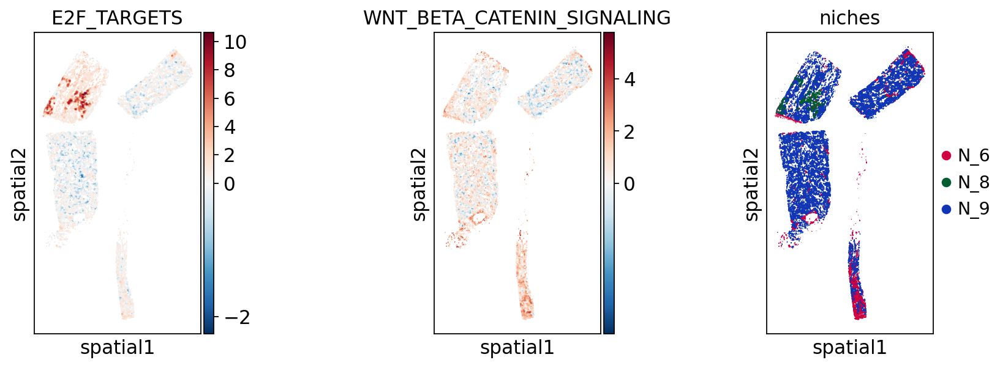

In [65]:
hms = ['E2F_TARGETS', 'WNT_BETA_CATENIN_SIGNALING']
sc.pl.spatial(score_niches, color=hms + ["niches"], cmap="RdBu_r", vcenter=0, size=5, spot_size = 10,
save='E2F_WNT_6-8-9-niches_10212025_spatial.pdf')

/tmp/ipykernel_5918/1755078399.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(score_niches, color=hms + ["niches"], cmap="RdBu_r", vcenter=0, size=5, spot_size = 10,


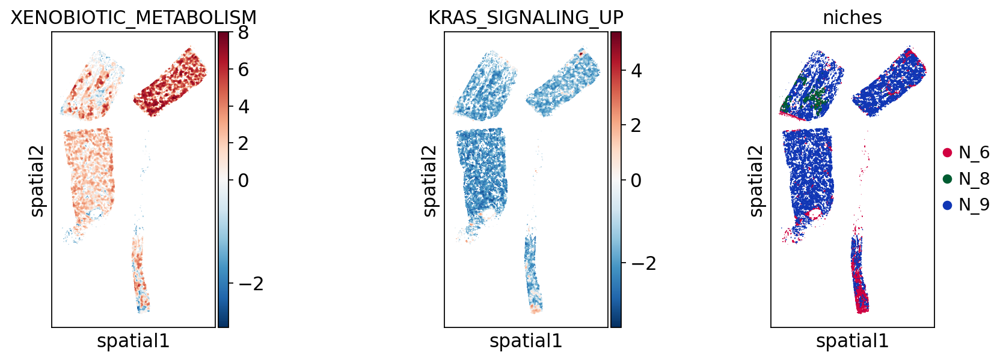

In [67]:
hms = ['XENOBIOTIC_METABOLISM', 'KRAS_SIGNALING_UP']
sc.pl.spatial(score_niches, color=hms + ["niches"], cmap="RdBu_r", vcenter=0, size=5, spot_size = 10,
save='XENO_KRAS_6-8-9-niches_10212025_spatial.pdf')

In [66]:
#Save the adata object
adata.write_h5ad('/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Full_Object_04-2025_Decoupler-10212025.h5ad', compression='gzip')

In [2]:
#load adata
adata = sc.read_h5ad('/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Full_Object_04-2025_Decoupler-10212025.h5ad')
adata

AnnData object with n_obs × n_vars = 383771 × 5001
    obs: 'library', 'nCount_Spatial', 'nFeature_Spatial', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'source', 'assay', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'age_binned', 'sex', 'race', 'tissue_type', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.l1', 'v2.state.l2', 'v2.state.l1', 'v2.class', 'v2.structure', 'nCount_niche', 'nFeature_niche', 'niches', 'conn'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_niches', 'log1p', 'niches_colors'
    obsm: 'padj_ulm', 'score_ulm', 'spati

In [ ]:
###DMR Associated Gene Sets
net = pd.read_csv('/weka/blake/Projects/Human_Kidney/Atlas_V2/xenium/DMR_DEG_CGI_GeneSets.csv')
net

,source,target
0,DMR_idx_aPT_up,ARHGEF38
1,DMR_idx_aPT_up,SLC9A9
2,DMR_idx_aPT_up,C11orf80
3,DMR_idx_aPT_up,ANKRD2
4,DMR_idx_aPT_up,ODF3B
...,...,...
325,DMR_idx_aPT_hypomethylation,AKTIP
326,DMR_idx_aPT_hypomethylation,RAPGEF3
327,DMR_idx_aPT_hypomethylation,ATP6V0A4
328,DMR_idx_aPT_hypomethylation,CHTOP


In [6]:
dc.mt.ulm(data=adata, net=net)

In [7]:
score = dc.pp.get_obsm(adata=adata, key="score_ulm")
score

AnnData object with n_obs × n_vars = 383771 × 4
    obs: 'library', 'nCount_Spatial', 'nFeature_Spatial', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'source', 'assay', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'age_binned', 'sex', 'race', 'tissue_type', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.l1', 'v2.state.l2', 'v2.state.l1', 'v2.class', 'v2.structure', 'nCount_niche', 'nFeature_niche', 'niches', 'conn'
    uns: 'dendrogram_niches', 'log1p', 'niches_colors'
    obsm: 'padj_ulm', 'score_ulm', 'spatial'

In [8]:
#Write score to h5ad
score.write_h5ad("/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Decoupler_GeneSet-Scores_10242025.h5ad", compression='gzip')

In [30]:
#load score
score = sc.read_h5ad("/weka/labs/kzhang/kzhang-lab-scratch/blake/HKAv2_Xenium_Decoupler_GeneSet-Scores_10242025.h5ad")
score

AnnData object with n_obs × n_vars = 383771 × 4
    obs: 'library', 'nCount_Spatial', 'nFeature_Spatial', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'source', 'assay', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'age_binned', 'sex', 'race', 'tissue_type', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.l1', 'v2.state.l2', 'v2.state.l1', 'v2.class', 'v2.structure', 'nCount_niche', 'nFeature_niche', 'niches', 'conn'
    uns: 'dendrogram_niches', 'log1p', 'niches_colors'
    obsm: 'padj_ulm', 'score_ulm', 'spatial'

In [9]:
#subset adata to only include cells in PT
score_niches = score[score.obs['v2.subclass.l1'].isin(['PT'])].copy()


/tmp/ipykernel_2216/1611231050.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


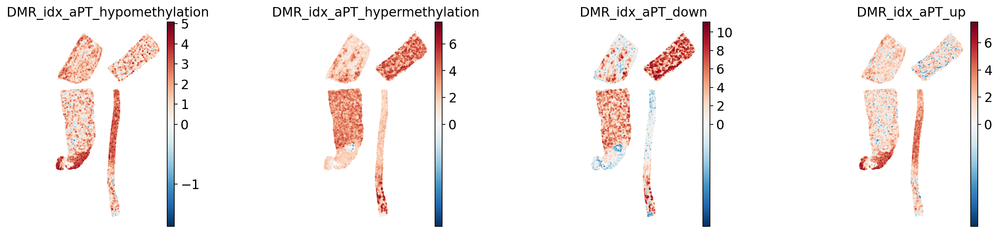

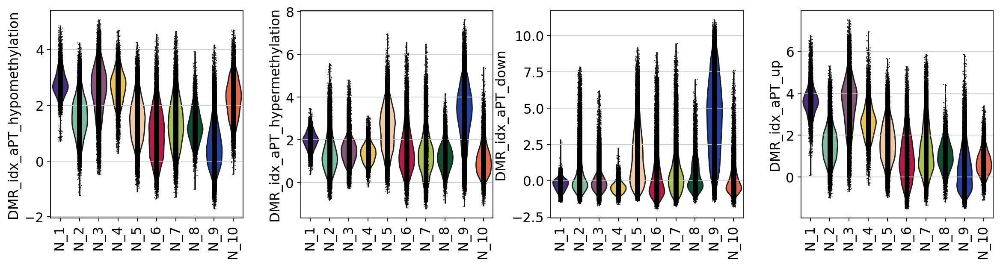

In [ ]:
###Plot scores in all cells
sc.pl.spatial(
    score,
    color=['DMR_idx_aPT_hypomethylation', 'DMR_idx_aPT_hypermethylation', 'DMR_idx_aPT_down', 'DMR_idx_aPT_up'],
    cmap='RdBu_r',
    size=5,spot_size = 10,
    vcenter=0,
    frameon=False,
    save='PT_DMR_GeneSets_10242025_spatial.pdf'
)
sc.pl.violin(
    score,
    keys=['DMR_idx_aPT_hypomethylation', 'DMR_idx_aPT_hypermethylation', 'DMR_idx_aPT_down', 'DMR_idx_aPT_up'],
    groupby='niches',
    rotation=90,
    save='PT_DMR_GeneSets_10242025_Violin.pdf'
)

/tmp/ipykernel_2216/782076067.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


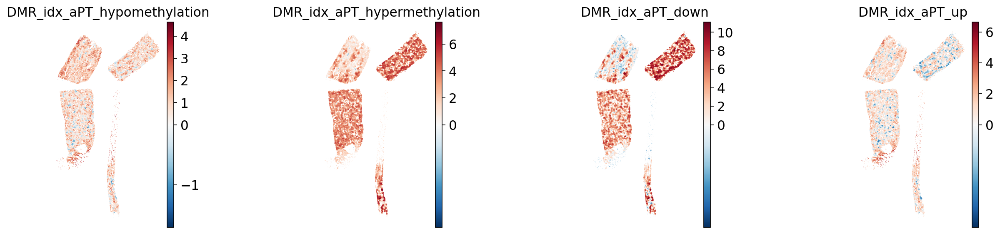

In [ ]:
###Plot scores in Only PT cells
sc.pl.spatial(
    score_niches,
    color=['DMR_idx_aPT_hypomethylation', 'DMR_idx_aPT_hypermethylation', 'DMR_idx_aPT_down', 'DMR_idx_aPT_up'],
    cmap='RdBu_r',
    size=5,spot_size = 10,
    vcenter=0,
    frameon=False,
    save='PT_DMR_GeneSets_10242025_spatial_PT-only.pdf'
)

/tmp/ipykernel_2216/2753260904.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(score_3782Xen14, color=['DMR_idx_aPT_hypomethylation', 'DMR_idx_aPT_hypermethylation',


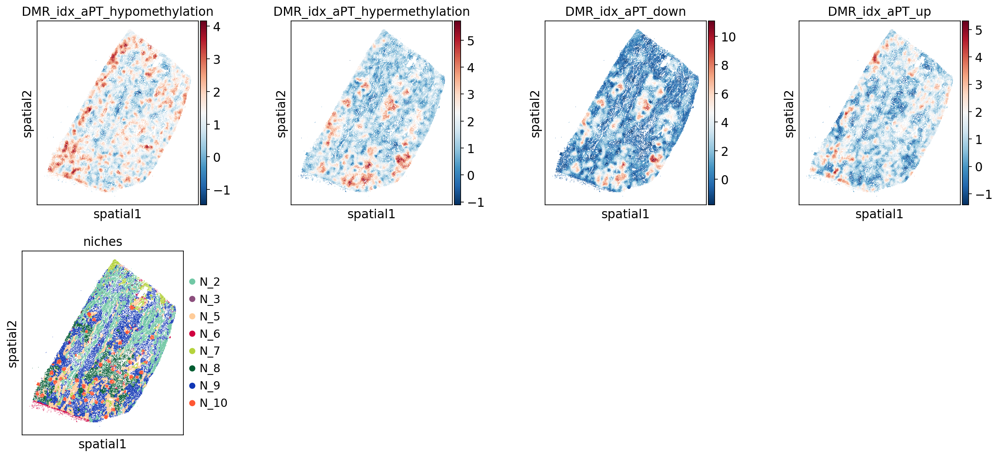

In [ ]:
#Plot Scores in AKI (all cells)
score_3782Xen14 = score[score.obs['library'].isin(['3782_Xen14'])].copy()
score_3782Xen14
sc.pl.spatial(score_3782Xen14, color=['DMR_idx_aPT_hypomethylation', 'DMR_idx_aPT_hypermethylation',
 'DMR_idx_aPT_down', 'DMR_idx_aPT_up'] + ["niches"], spot_size = 10, size=2, cmap='RdBu_r',
    save='PT_DMR_GeneSets_10242025_spatial_3782Xen14.pdf')

/tmp/ipykernel_2216/2678568454.py:7: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(score_3916Xen15_bottom, color=['DMR_idx_aPT_hypomethylation', 'DMR_idx_aPT_hypermethylation',


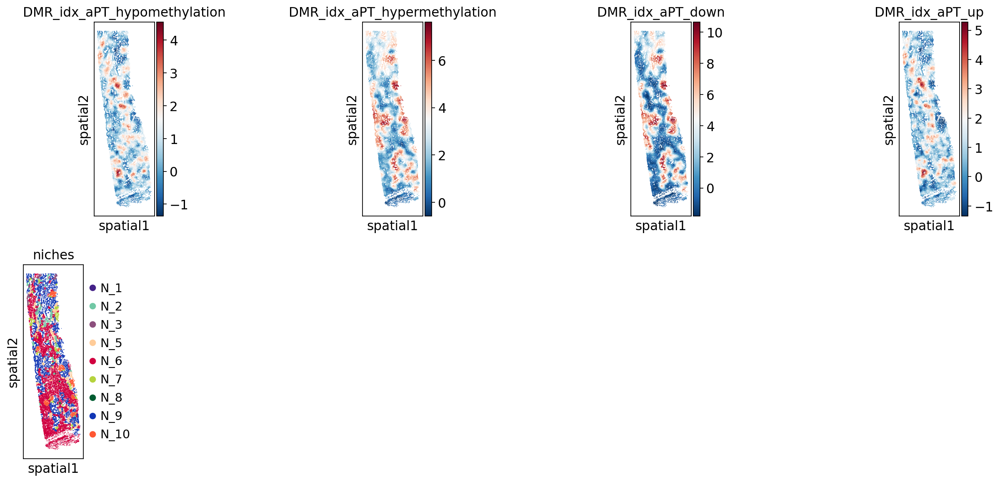

In [ ]:
#Plot Scores in CKD (all cells)
score_3916Xen15 = score[score.obs['library'].isin(['3916_Xen15'])].copy()

#subset adata_3916Xen15 to only include spatial coordinates in bottom half (cortex)
score_3916Xen15_bottom = score_3916Xen15[score_3916Xen15.obsm['spatial'][:, 1] > 20000].copy()

sc.pl.spatial(score_3916Xen15_bottom, color=['DMR_idx_aPT_hypomethylation', 'DMR_idx_aPT_hypermethylation',
 'DMR_idx_aPT_down', 'DMR_idx_aPT_up'] + ["niches"], spot_size = 10, size=2, cmap='RdBu_r',
    save='PT_DMR_GeneSets_10242025_spatial_3916Xen15.pdf')

/tmp/ipykernel_2216/1164306090.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_3782Xen14, color=genes + ["niches"], spot_size = 10, size=2,


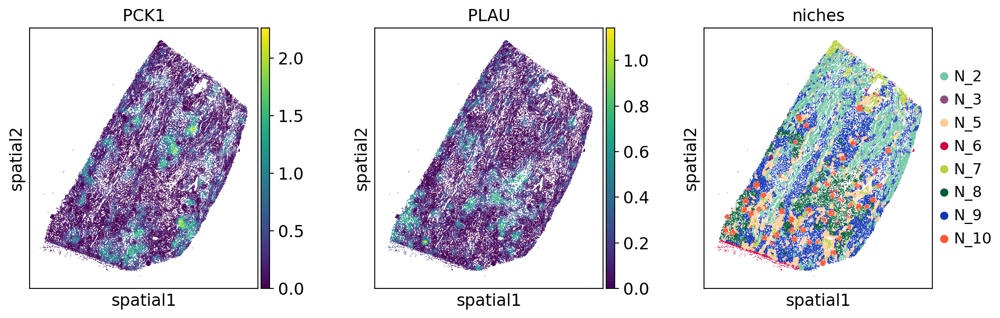

In [ ]:
#Plot Select Genes in AKI (all cells)
adata_3782Xen14 = adata[adata.obs['library'].isin(['3782_Xen14'])].copy()
adata_3782Xen14
genes = ['PCK1', 'PLAU']
sc.pl.spatial(adata_3782Xen14, color=genes + ["niches"], spot_size = 10, size=2,
    save='PT_DMR_GeneSets_PT_10242025_Spatial_PCK1_PLAU_3782Xen14.pdf')

/tmp/ipykernel_2216/2483337351.py:9: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_3916Xen15_bottom, color=genes + ["niches"], spot_size = 10, size=2,


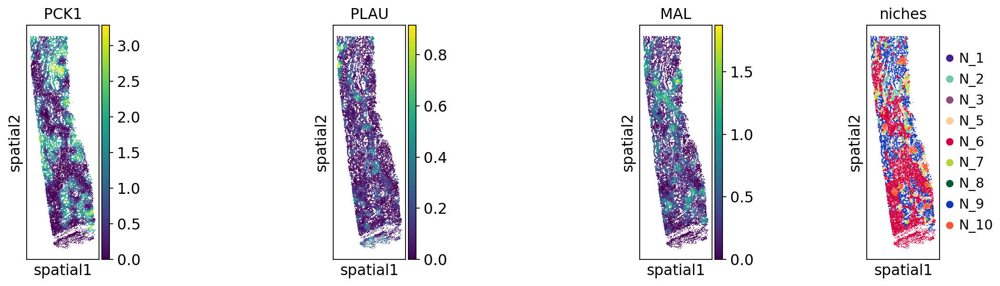

In [ ]:
#Plot Select Genes in CKD (all cells)
adata_3916Xen15 = adata[adata.obs['library'].isin(['3916_Xen15'])].copy()
adata_3916Xen15

#subset adata_3916Xen15 to only include spatial coordinates in bottom half (cortex)
adata_3916Xen15_bottom = adata_3916Xen15[adata_3916Xen15.obsm['spatial'][:, 1] > 20000].copy()

genes = ['PCK1', 'PLAU', 'MAL']
sc.pl.spatial(adata_3916Xen15_bottom, color=genes + ["niches"], spot_size = 10, size=2,
    save='PT_DMR_GeneSets_PT_10242025_Spatial_PCK1_PLAU_3916Xen15.pdf')

/tmp/ipykernel_2216/3400316377.py:8: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_3723Xen15_cortex, color=genes + ["niches"], spot_size = 10, size=2,


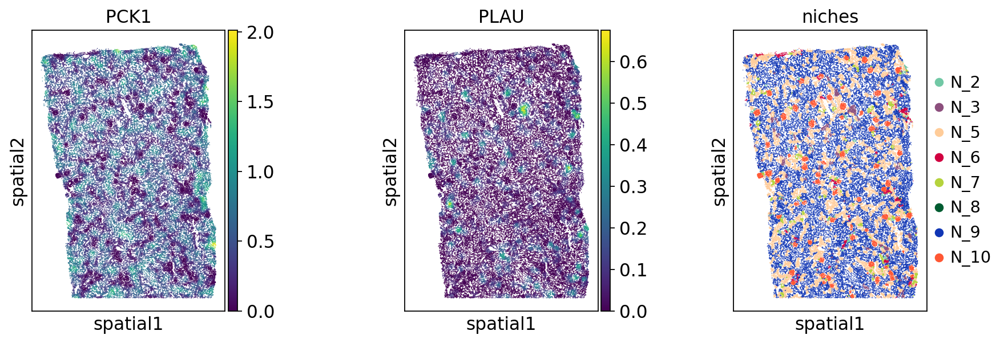

In [ ]:
#Plot Select Genes in HRT (all cells)
adata_3723Xen15 = adata[adata.obs['library'].isin(['3723_Xen15'])].copy()

#subset adata_3916Xen15 to only include spatial coordinates in cortex
adata_3723Xen15_cortex = adata_3723Xen15[adata_3723Xen15.obsm['spatial'][:, 1] < 15000].copy()

genes = ['PCK1', 'PLAU']
sc.pl.spatial(adata_3723Xen15_cortex, color=genes + ["niches"], spot_size = 10, size=2,
    save='PT_DMR_GeneSets_PT_10242025_Spatial_PCK1_PLAU_3723Xen15.pdf')

/tmp/ipykernel_2216/801893374.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_3778Xen14, color=genes + ["niches"], spot_size = 10, size=2,


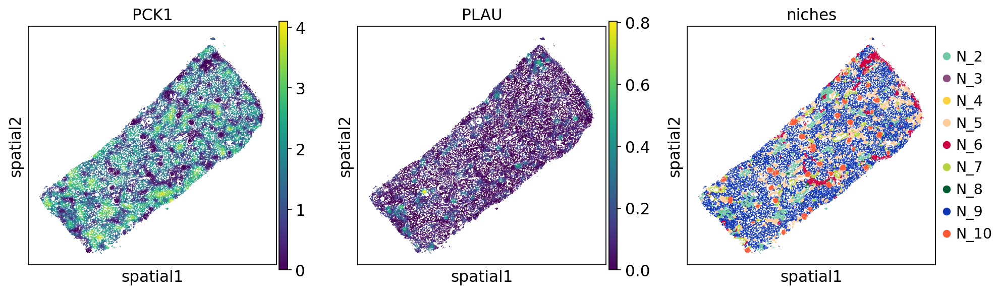

In [ ]:
#Plot Select Genes in HRT (all cells)
adata_3778Xen14 = adata[adata.obs['library'].isin(['3778_Xen14'])].copy()

genes = ['PCK1', 'PLAU']
sc.pl.spatial(adata_3778Xen14, color=genes + ["niches"], spot_size = 10, size=2,
    save='PT_DMR_GeneSets_PT_10242025_Spatial_PCK1_PLAU_3778Xen14.pdf')

In [2]:
#package versions
print(f"scanpy: {sc.__version__}")
print(f"decoupler: {dc.__version__}")
print(f"numpy: {np.__version__}")
print(f"pandas: {pd.__version__}")

scanpy: 1.11.5
decoupler: 2.1.1
numpy: 2.3.3
pandas: 2.3.3


/tmp/ipykernel_22596/3866504646.py:2: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  print(f"scanpy: {sc.__version__}")
